In [1]:
import pandas as pd
import numpy as np
import pandas_ta as ta
import vectorbt as vbt
import yfinance as yf
import matplotlib.pyplot as plt
import warnings
plt.rcParams["figure.figsize"] = (15,8)
warnings.filterwarnings("ignore")

In [17]:
df = yf.download(tickers='PTT.BK',start='2012-01-01',end='2022-08-25', interval = '1d')
df.head()

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2012-01-04,32.299999,32.500000,32.200001,32.400002,20.626562,39899000
2012-01-05,32.400002,32.799999,32.299999,32.799999,20.881212,42206000
2012-01-06,32.700001,32.700001,32.200001,32.299999,20.562897,23963000
2012-01-09,32.200001,32.500000,32.099998,32.400002,20.626562,33054000
2012-01-10,32.400002,32.700001,32.299999,32.400002,20.626562,58131000


Long Condition :
buy dca every day if rsi < 25

Exit Condition :
rsi > 70

In [18]:
df.ta.rsi(append=True)

Date
2012-01-04          NaN
2012-01-05          NaN
2012-01-06          NaN
2012-01-09          NaN
2012-01-10          NaN
                ...    
2022-08-18    66.110692
2022-08-19    62.596703
2022-08-22    59.207555
2022-08-23    65.280727
2022-08-24    67.042129
Name: RSI_14, Length: 2592, dtype: float64

In [19]:
df

,Open,High,Low,Close,Adj Close,Volume,RSI_14
Date,,,,,,,
2012-01-04,32.299999,32.500000,32.200001,32.400002,20.626562,39899000,NaN
2012-01-05,32.400002,32.799999,32.299999,32.799999,20.881212,42206000,NaN
2012-01-06,32.700001,32.700001,32.200001,32.299999,20.562897,23963000,NaN
2012-01-09,32.200001,32.500000,32.099998,32.400002,20.626562,33054000,NaN
2012-01-10,32.400002,32.700001,32.299999,32.400002,20.626562,58131000,NaN
...,...,...,...,...,...,...,...
2022-08-18,37.500000,37.750000,37.000000,37.250000,35.932312,45521500,66.110692
2022-08-19,37.250000,37.500000,37.000000,37.000000,35.691154,38474800,62.596703
2022-08-22,37.000000,37.500000,36.750000,36.750000,35.450001,52110800,59.207555


In [20]:
long_entries = df['RSI_14'] < 25
long_exits = df['RSI_14'] > 70

In [21]:
long_entries[long_entries]

Date
2013-11-22    True
2013-11-25    True
2013-11-26    True
2014-01-03    True
2014-01-06    True
2014-12-15    True
2014-12-16    True
2015-07-22    True
2015-08-18    True
2015-08-19    True
2015-08-20    True
2015-08-21    True
2015-08-24    True
2015-12-11    True
2019-08-05    True
2019-08-06    True
2019-08-07    True
2019-08-08    True
2019-08-09    True
2019-08-13    True
2019-08-14    True
2019-08-15    True
2019-08-16    True
2019-08-26    True
2019-08-27    True
2019-08-28    True
2020-03-09    True
2020-03-10    True
2020-03-11    True
2020-03-12    True
2020-03-13    True
2020-03-16    True
2020-03-17    True
2020-03-18    True
2020-03-19    True
2020-09-24    True
2020-09-25    True
2021-07-12    True
2021-07-30    True
2022-06-17    True
2022-06-20    True
2022-06-23    True
2022-06-24    True
Name: RSI_14, dtype: bool

In [36]:
port = vbt.Portfolio.from_signals(df.Close,
                                        entries = long_entries,
                                        exits = long_exits,
                                        size = 1,
                                  init_cash = 100,# default is 100
                                        size_type=0,
                                        fees=0.0015)

In [32]:
port.plot().show()

In [33]:
port.orders.records_readable

,Order Id,Column,Timestamp,Size,Price,Fees,Side
0,0,0,2013-11-22,1.0,29.700001,0.044550,Buy
1,1,0,2014-07-07,1.0,32.599998,0.048900,Sell
2,2,0,2014-12-15,1.0,31.400000,0.047100,Buy
3,3,0,2015-11-04,1.0,29.900000,0.044850,Sell
4,4,0,2015-12-11,1.0,22.000000,0.033000,Buy
5,5,0,2016-03-04,1.0,27.700001,0.041550,Sell
6,6,0,2019-08-05,1.0,45.750000,0.068625,Buy
7,7,0,2020-01-06,1.0,47.000000,0.070500,Sell
8,8,0,2020-03-09,1.0,28.000000,0.042000,Buy
9,9,0,2020-06-08,1.0,40.750000,0.061125,Sell


In [ ]:

https://vectorbt.dev/api/portfolio/enums/#vectorbt.portfolio.enums.SizeType

In [51]:
# mode both 
# try mode
port = vbt.Portfolio.from_signals(df.Close,
                                        entries = long_entries,
                                        exits = long_exits,
                                        size = 1,
                                        init_cash = 100, #try it 200
                                        fees=0.0015,
                                        accumulate='RemoveOnly')
port.plot().show()

In [52]:
port.orders.records_readable

,Order Id,Column,Timestamp,Size,Price,Fees,Side
0,0,0,2013-11-22,1.0,29.700001,0.044550,Buy
1,1,0,2014-07-07,1.0,32.599998,0.048900,Sell
2,2,0,2014-12-15,1.0,31.400000,0.047100,Buy
3,3,0,2015-11-04,1.0,29.900000,0.044850,Sell
4,4,0,2015-12-11,1.0,22.000000,0.033000,Buy
5,5,0,2016-03-04,1.0,27.700001,0.041550,Sell
6,6,0,2019-08-05,1.0,45.750000,0.068625,Buy
7,7,0,2020-01-06,1.0,47.000000,0.070500,Sell
8,8,0,2020-03-09,1.0,28.000000,0.042000,Buy
9,9,0,2020-06-08,1.0,40.750000,0.061125,Sell


In [45]:
# try mode remove only
port = vbt.Portfolio.from_signals(df.Close,
                                        entries = long_entries,
                                        exits = long_exits,
                                        size = 1,
                                        init_cash = 100, #try it 200
                                        fees=0.0015,
                                        accumulate='RemoveOnly')

In [46]:
port.plot().show()

In [47]:
a = port.orders.records_readable
a['amount_paid'] = a['Size'] * a['Price'] + a['Fees']
a.head(20)

,Order Id,Column,Timestamp,Size,Price,Fees,Side,amount_paid
0,0,0,2013-11-22,1.0,29.700001,0.044550,Buy,29.744551
1,1,0,2014-07-07,1.0,32.599998,0.048900,Sell,32.648898
2,2,0,2014-12-15,1.0,31.400000,0.047100,Buy,31.447100
3,3,0,2015-11-04,1.0,29.900000,0.044850,Sell,29.944850
4,4,0,2015-12-11,1.0,22.000000,0.033000,Buy,22.033000
5,5,0,2016-03-04,1.0,27.700001,0.041550,Sell,27.741551
6,6,0,2019-08-05,1.0,45.750000,0.068625,Buy,45.818625
7,7,0,2020-01-06,1.0,47.000000,0.070500,Sell,47.070500
8,8,0,2020-03-09,1.0,28.000000,0.042000,Buy,28.042000
9,9,0,2020-06-08,1.0,40.750000,0.061125,Sell,40.811125


# ADD CUT LOST



In [56]:
port = vbt.Portfolio.from_signals(df.Close,
                                        entries = long_entries,
                                        exits = long_exits,
                                        size = 1,
                                        init_cash = 100, #try it 200
                                        fees=0.0015,
                                        accumulate='AddOnly',
                                        sl_stop = 0.05)

In [57]:
port.plot().show()

In [58]:
port.orders.records_readable

,Order Id,Column,Timestamp,Size,Price,Fees,Side
0,0,0,2013-11-22,1.000000,29.700001,0.044550,Buy
1,1,0,2013-11-25,1.000000,29.299999,0.043950,Buy
2,2,0,2013-11-26,1.000000,29.100000,0.043650,Buy
3,3,0,2014-01-02,3.000000,27.400000,0.123300,Sell
4,4,0,2014-01-03,1.000000,26.799999,0.040200,Buy
5,5,0,2014-01-06,1.000000,26.400000,0.039600,Buy
6,6,0,2014-07-07,2.000000,32.599998,0.097800,Sell
7,7,0,2014-12-15,1.000000,31.400000,0.047100,Buy
8,8,0,2014-12-16,1.000000,30.299999,0.045450,Buy
9,9,0,2015-07-22,1.000000,31.400000,0.047100,Buy


In [59]:
# add atr
# Initial Indicator
df['atr'] = df.ta.atr(10)
df['atr_lowerband'] = df['Close']-df['atr']
df['atr_upperband'] = df['Close']+df['atr']

<AxesSubplot:xlabel='Date'>

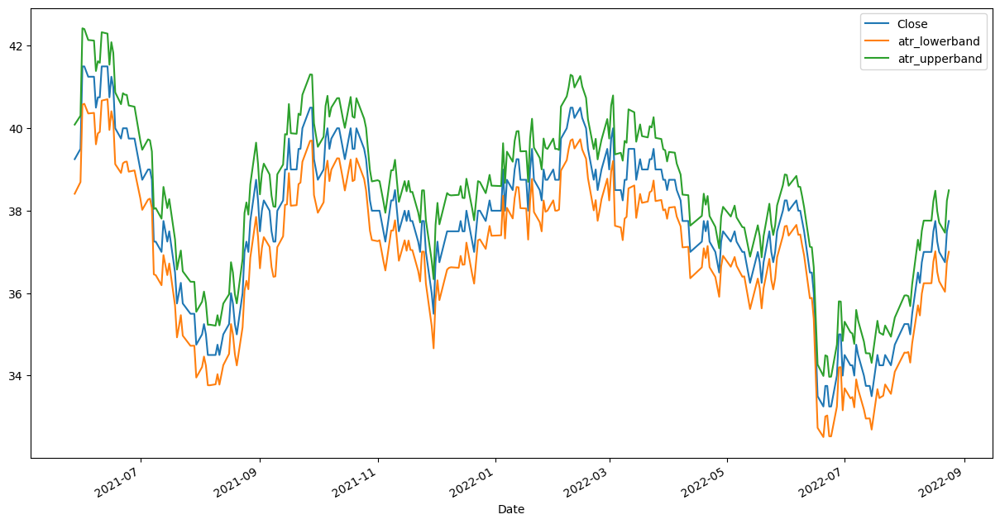

In [60]:
df.iloc[-300:].plot(y=['Close','atr_lowerband','atr_upperband'])

In [61]:
df['atr_lowerband'] = df['Close'].rolling(5).mean() - 0.5*df['atr']
df['atr_upperband'] = df['Close'].rolling(5).mean() + 0.5*df['atr']

<AxesSubplot:xlabel='Date'>

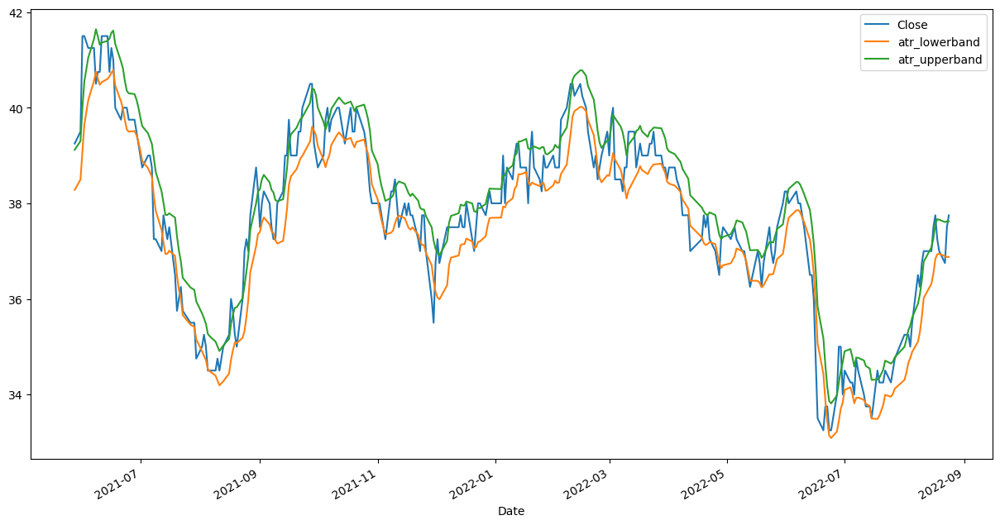

In [62]:
df.iloc[-300:].plot(y=['Close','atr_lowerband','atr_upperband'])

In [63]:
df['sl_trig'] = df['Close'] < df['atr_lowerband']

In [64]:
new_exit = long_exits | df['sl_trig']

In [65]:
port = vbt.Portfolio.from_signals(df.Close,
                                        entries = long_entries,
                                        exits = new_exit,
                                        size = 1,
                                        init_cash = 100, #try it 200
                                        fees=0.0015,
                                        accumulate='AddOnly')

In [66]:
port.plot().show()

In [ ]:
# this section find conflict in trading

In [67]:
a = new_exit[new_exit] & long_entries[long_entries]
a[a]

Date
2013-11-22    True
2013-11-25    True
2013-11-26    True
2014-01-03    True
2014-01-06    True
2014-12-15    True
2014-12-16    True
2015-07-22    True
2015-08-18    True
2015-08-19    True
2015-08-20    True
2015-08-21    True
2015-08-24    True
2015-12-11    True
2019-08-05    True
2019-08-06    True
2019-08-07    True
2019-08-08    True
2019-08-09    True
2019-08-13    True
2019-08-14    True
2019-08-15    True
2019-08-26    True
2019-08-27    True
2019-08-28    True
2020-03-09    True
2020-03-10    True
2020-03-11    True
2020-03-12    True
2020-03-16    True
2020-09-24    True
2020-09-25    True
2021-07-12    True
2021-07-30    True
2022-06-17    True
2022-06-20    True
dtype: bool

In [68]:
long_entries[long_entries]

Date
2013-11-22    True
2013-11-25    True
2013-11-26    True
2014-01-03    True
2014-01-06    True
2014-12-15    True
2014-12-16    True
2015-07-22    True
2015-08-18    True
2015-08-19    True
2015-08-20    True
2015-08-21    True
2015-08-24    True
2015-12-11    True
2019-08-05    True
2019-08-06    True
2019-08-07    True
2019-08-08    True
2019-08-09    True
2019-08-13    True
2019-08-14    True
2019-08-15    True
2019-08-16    True
2019-08-26    True
2019-08-27    True
2019-08-28    True
2020-03-09    True
2020-03-10    True
2020-03-11    True
2020-03-12    True
2020-03-13    True
2020-03-16    True
2020-03-17    True
2020-03-18    True
2020-03-19    True
2020-09-24    True
2020-09-25    True
2021-07-12    True
2021-07-30    True
2022-06-17    True
2022-06-20    True
2022-06-23    True
2022-06-24    True
Name: RSI_14, dtype: bool

In [ ]:
# this section will add upon long conflict when confilct will long order

In [69]:
port = vbt.Portfolio.from_signals(df.Close,
                                        entries = long_entries,
                                        exits = new_exit,
                                        size = 1,
                                        init_cash = 100, #try it 200
                                        fees=0.0015,
                                        accumulate='AddOnly',
                                        #upon_dir_conflict ='Long') # cannot use if we don't input short entries and exits
                                        upon_long_conflict='Entry')

In [70]:
port.plot().show()

In [71]:
df['sl_trig'] = df['Close'].vbt.crossed_below(df['atr_lowerband'])
new_exit = long_exits | df['sl_trig']

In [72]:
short_entries = df['RSI_14'] > 75 
short_exits = df['RSI_14'] < 20

In [73]:
b = short_exits & new_exit
b[b]

Series([], dtype: bool)

In [83]:
port = vbt.Portfolio.from_signals(df.Close,
                                        entries = long_entries,
                                        exits = new_exit,
                                        short_entries = short_entries,
                                        short_exits = short_exits,
                                        size = 1,
                                        init_cash = 200, #try it 200
                                        fees=0.0015,
                                        accumulate='RemoveOnly',
                                        #upon_dir_conflict ='Long',
                                        upon_long_conflict='Entry')

In [84]:
port.plot().show()

In [85]:
port.orders.records_readable

,Order Id,Column,Timestamp,Size,Price,Fees,Side
0,0,0,2012-02-09,1.0,35.099998,0.052650,Sell
1,1,0,2013-11-22,1.0,29.700001,0.044550,Buy
2,2,0,2013-11-25,1.0,29.299999,0.043950,Buy
3,3,0,2013-12-12,1.0,29.700001,0.044550,Sell
4,4,0,2014-01-03,1.0,26.799999,0.040200,Buy
5,5,0,2014-01-22,1.0,28.200001,0.042300,Sell
6,6,0,2014-12-15,1.0,31.400000,0.047100,Buy
7,7,0,2014-12-25,1.0,32.799999,0.049200,Sell
8,8,0,2015-07-22,1.0,31.400000,0.047100,Buy
9,9,0,2015-08-06,1.0,31.600000,0.047400,Sell


In [86]:
port = vbt.Portfolio.from_signals(df.Close,
                                        entries = long_entries,
                                        exits = long_exits,
                                        #size = 2,
                                        #size_type=0,
                                        fees=0.0015)

In [87]:
W = port.trades.win_rate() # winrate
A = abs(port.trades.losing.returns.mean()) # avg losing trade
B = port.trades.winning.returns.mean() # avg winning trade
Percent_kelly = (W/A) - ((1-W)/B)
Percent_kelly

16.534063192858493

In [114]:
port = vbt.Portfolio.from_signals(df.Close,
                                        entries = long_entries,
                                        exits = long_exits,
                                        size = Percent_kelly/100*2*10000,
                                        size_type='Value',
                                        init_cash = 10000, #try it 200
                                        fees=0.0015,
                                        accumulate='AddOnly',
                                        #upon_dir_conflict ='Long',
                                        upon_long_conflict='Entry')

# now in accumulate and upon conflict can use only size type fix value only cannot 
#use percent for test



In [115]:
port.plot().show()

In [116]:
c = port.orders.records_readable
c['Amount'] = c['Size'] * c['Price']+ c['Fees']
c

,Order Id,Column,Timestamp,Size,Price,Fees,Side,Amount
0,0,0,2013-11-22,111.340490,29.700001,4.960219,Buy,3311.772858
1,1,0,2013-11-25,112.860503,29.299999,4.960219,Buy,3311.772858
2,2,0,2013-11-26,113.636172,29.100000,4.960219,Buy,3311.772858
3,3,0,2014-01-03,2.409871,26.799999,0.096877,Buy,64.681427
4,4,0,2014-07-07,340.247036,32.599998,16.638079,Sell,11108.690920
5,5,0,2014-12-15,105.312506,31.400000,4.960219,Buy,3311.772858
6,6,0,2014-12-16,109.135733,30.299999,4.960219,Buy,3311.772858
7,7,0,2015-07-22,105.312506,31.400000,4.960219,Buy,3311.772858
8,8,0,2015-08-18,40.656736,28.000000,1.707583,Buy,1140.096189
9,9,0,2015-11-04,360.417481,29.900000,16.164724,Sell,10792.647260
